<h1 style="background-color:orange;font-family:newtimeroman;font-size:350%;text-align:center;border-radius: 15px 50px;">Table Of Content</h1>


* [1. Introduction](#1)
    * [1.1 Libraries And Utilities](#1.1)
    * [1.2 Data Loading](#1.2)
* [2. Exploratory Data Analysis(EDA)](#2)
* [3. Data Preprocessing](#3)
    * [3.1 Data Upsampling Using SMOTE](#3.1)
    * [3.2 Principal Component Analysis Of One Hot Encoded Data](#3.2)  
* [4. Model Selection And Evaluation](#4) 
    * [4.1 Cross Validation](#4.1)
    * [4.2 Model Evaluation](#4.2)
    * [4.3 Model Evaluation On Original Data (Before Upsampling)](#4.3)
* [5. Results](#5) 


<a id="1.1"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Libraries And Utilities</h3>

In [15]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
from seaborn import color_palette

pyo.init_notebook_mode()
sns.set_style('darkgrid')
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.metrics import confusion_matrix

plt.rc('figure',figsize=(18,9))
%pip install imbalanced-learn
from imblearn.over_sampling import SMOTE

Note: you may need to restart the kernel to use updated packages.


<a id="1.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Data Loading</h3>


In [42]:
c_data = pd.read_csv('BankChurners.csv')
c_data = c_data[c_data.columns[1:-2]]
c_data.head(3)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000


<a id="2"></a>
<h1 style="background-color:orange;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">Exploratory Data Analysis</h1>


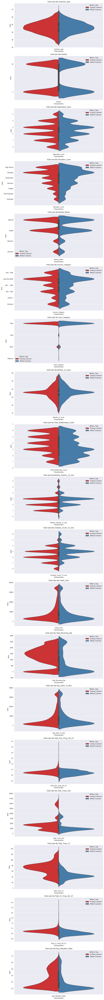

In [43]:
data_div = pd.melt(c_data, id_vars='Attrition_Flag', var_name="Characteristics")

fig, axes = plt.subplots(len(c_data.columns) - 1, 1, figsize=(10, 5 * (len(c_data.columns) - 1)))

for i, column in enumerate(c_data.drop("Attrition_Flag", axis=1).columns):
    ax = axes[i]
    sns.violinplot(x="Characteristics", y="value", hue="Attrition_Flag", data=data_div[data_div["Characteristics"] == column], palette="Set1", split=True, ax=ax)
    ax.set_title(f"Violin plot dla {column}")

plt.tight_layout()
plt.show()

In [47]:

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

columns_to_encode = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

for column in columns_to_encode:
    c_data[column] = label_encoder.fit_transform(c_data[column])

    print(f"Przyporządkowanie liter do liczb dla {column}:")
    for label, encoded_value in zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)):
        print(f"{label} -> {encoded_value}")
    print()
    
c_data.head(30)

Przyporządkowanie liter do liczb dla Attrition_Flag:
Attrited Customer -> 0
Existing Customer -> 1

Przyporządkowanie liter do liczb dla Gender:
0 -> 0
1 -> 1

Przyporządkowanie liter do liczb dla Education_Level:
0 -> 0
1 -> 1
2 -> 2
3 -> 3
4 -> 4
5 -> 5
6 -> 6

Przyporządkowanie liter do liczb dla Marital_Status:
0 -> 0
1 -> 1
2 -> 2
3 -> 3

Przyporządkowanie liter do liczb dla Income_Category:
0 -> 0
1 -> 1
2 -> 2
3 -> 3
4 -> 4
5 -> 5

Przyporządkowanie liter do liczb dla Card_Category:
0 -> 0
1 -> 1
2 -> 2
3 -> 3



,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,1,45,1,3,3,1,2,0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,1,49,0,5,2,2,4,0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,1,51,1,3,2,1,3,0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,1,40,0,4,3,3,4,0,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,1,40,1,3,5,1,2,0,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,1,44,1,2,2,1,1,0,36,3,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,1,51,1,4,6,1,0,1,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,1,32,1,0,3,3,2,3,27,2,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,1,37,1,3,5,2,2,0,36,5,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,1,48,1,2,2,2,3,0,36,6,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


<Axes: >

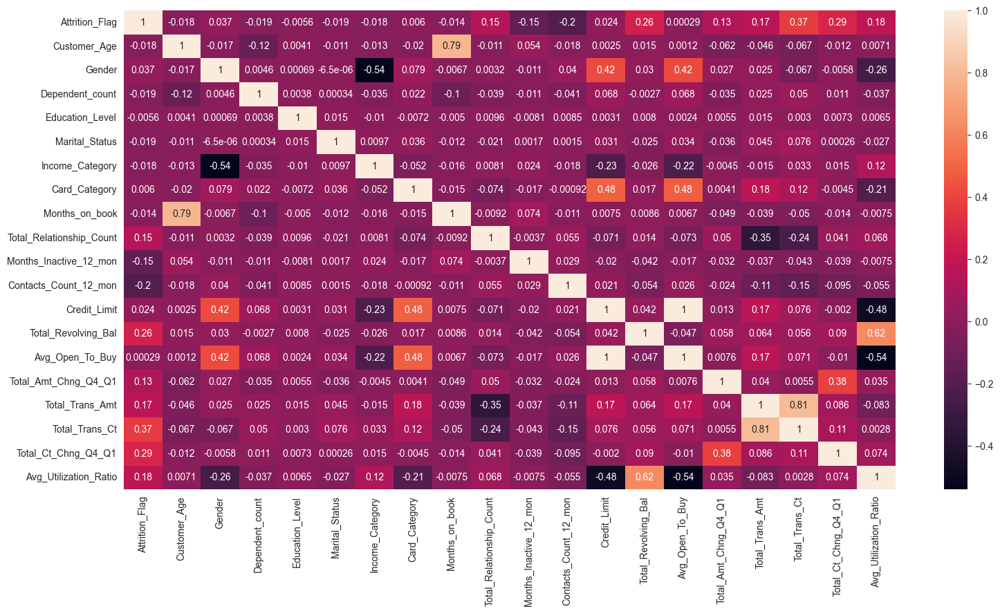

In [56]:
sns.heatmap(data=c_data.corr(), annot=c_data.corr())


<Figure size 1000x1000 with 0 Axes>

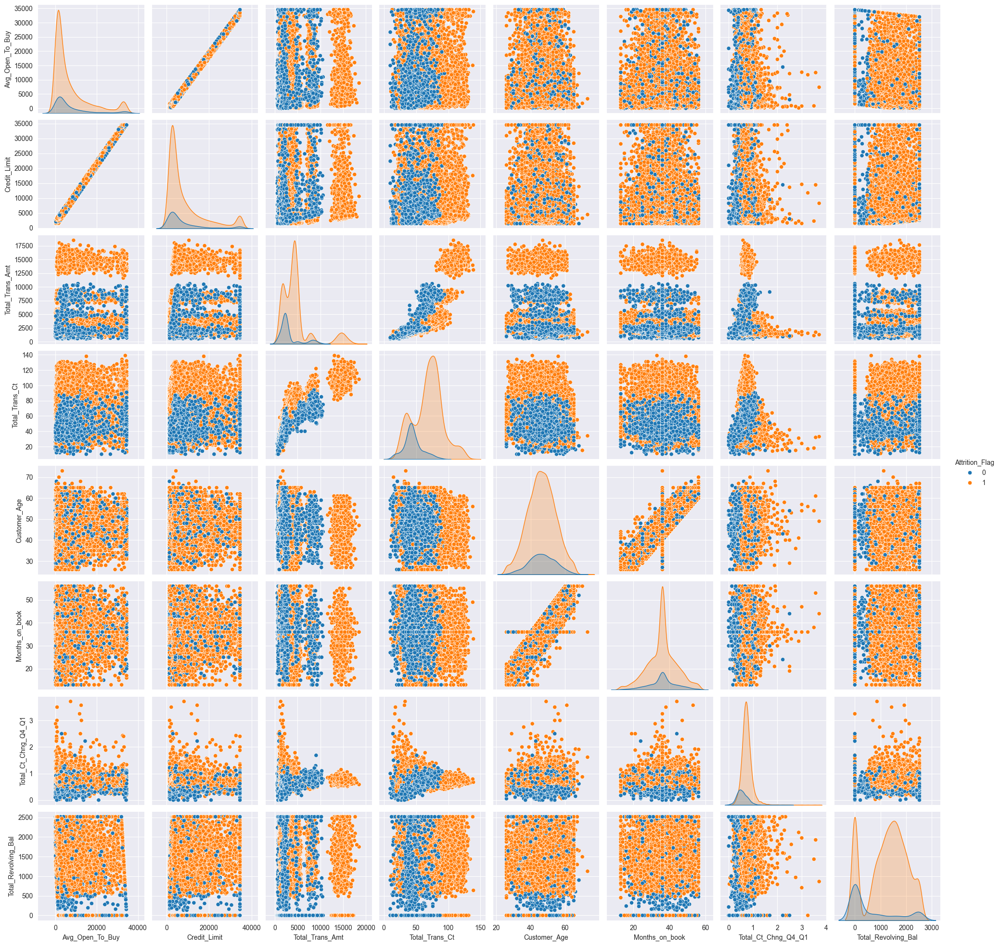

In [57]:
plt.figure(figsize=(10,10), dpi = 100)
sns.pairplot(data=c_data[['Attrition_Flag', 'Avg_Open_To_Buy', 'Credit_Limit', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Customer_Age', 'Months_on_book', 'Total_Ct_Chng_Q4_Q1', 'Total_Revolving_Bal']], kind='scatter', hue='Attrition_Flag')


In [58]:
ex.pie(c_data,names='Attrition_Flag',title='Proportion of churn vs not churn customers',hole=0.33)

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>As we can see, only 16% of the data samples represent churn customers; in the following steps, I will use SMOTE to upsample the churn samples to match them with the regular customer sample size to give the later selected models a better chance of catching on small details which will almost definitely be missed out with such a size difference.</span></p>

In [70]:
def podziel(X, Y):
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3)
  return {"X_train":X_train, "X_test":X_test, "Y_train":Y_train, "Y_test":Y_test}
def podaj_dokladnosc(confusion_matrix, df):
    wszystkie = len(df['Y_test'])
    trafione = confusion_matrix[0][0] + confusion_matrix[1][1]
    return (trafione/wszystkie)*100


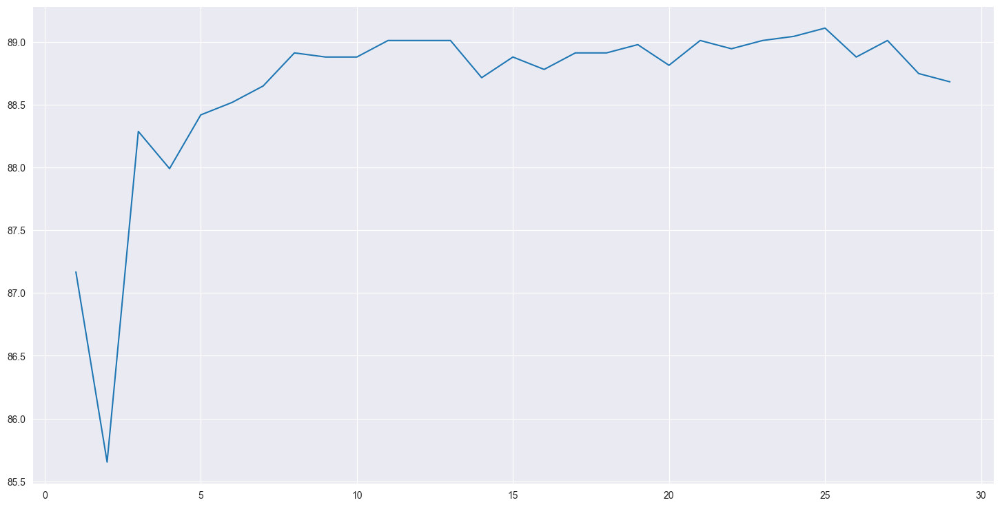

In [75]:
from sklearn.neighbors import KNeighborsClassifier
#wyodrębnienie kolumny od reszty atrybutów, zbiór uczący i testowy
X = c_data.drop(['Attrition_Flag'], axis = 1)
Y = c_data['Attrition_Flag']
dane = podziel(c_data, X, Y)
# podział zbioru danych
d = podziel(X, Y)

wyniki_knn = {}
for i in range(1, 30, 1):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn = knn.fit(d["X_train"], d["Y_train"])
    knn_predict = knn.predict(d["X_test"])
    confusion_matrix_knn = confusion_matrix(d["Y_test"], knn_predict)
    wyniki_knn.update({i:podaj_dokladnosc(confusion_matrix_knn, d)})

plt.plot(wyniki_knn.keys(), wyniki_knn.values())

Dokładność klasyfikacji 25-NN:  88.77920368542284 %


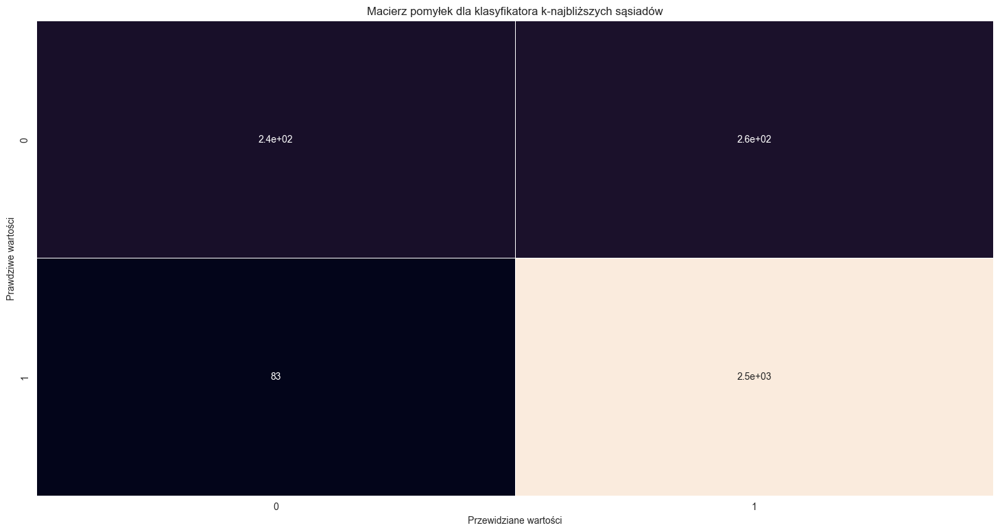

In [80]:
knn = KNeighborsClassifier(n_neighbors=25)
knn = knn.fit(dane["X_train"], dane["Y_train"])
knn_predict = knn.predict(dane["X_test"])
confusion_matrix_knn = confusion_matrix(dane["Y_test"], knn_predict)

sns.heatmap(confusion_matrix_knn, annot = True, linewidths = .5, cbar = None)
plt.title('Macierz pomyłek dla klasyfikatora k-najbliższych sąsiadów')
plt.ylabel('Prawdziwe wartości')
plt.xlabel('Przewidziane wartości')

dokladnosc_knn = podaj_dokladnosc(confusion_matrix_knn, dane)
print("Dokładność klasyfikacji 25-NN: ", dokladnosc_knn, "%")

<a id="3.1"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Data Upsampling Using SMOTE</h3>


In [59]:
oversample = SMOTE()
X, y = oversample.fit_resample(c_data[c_data.columns[1:]], c_data[c_data.columns[0]])
usampled_df = X.assign(Churn = y)

In [60]:
ohe_data =usampled_df[usampled_df.columns[15:-1]].copy()

usampled_df = usampled_df.drop(columns=usampled_df.columns[15:-1])

In [61]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =usampled_df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =usampled_df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations")
fig.show()


<a id="3.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Principal Component Analysis Of One Hot Encoded Data </h3>


<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>We will use principal component analysis to reduce the dimensionality of the one-hot encoded categorical variables losing some of the variances, but simultaneously, using a couple of principal components instead of tens of one-hot encoded features will help me construct a better model.</span></p>

In [76]:

N_COMPONENTS = 4

pca_model = PCA(n_components = N_COMPONENTS )

pc_matrix = pca_model.fit_transform(ohe_data)

evr = pca_model.explained_variance_ratio_
total_var = evr.sum() * 100
cumsum_evr = np.cumsum(evr)

trace1 = {
    "name": "individual explained variance", 
    "type": "bar", 
    'y':evr}
trace2 = {
    "name": "cumulative explained variance", 
    "type": "scatter", 
     'y':cumsum_evr}
data = [trace1, trace2]
layout = {
    "xaxis": {"title": "Principal components"}, 
    "yaxis": {"title": "Explained variance ratio"},
  }
fig = go.Figure(data=data, layout=layout)
fig.update_layout(     title='Explained Variance Using {} Dimensions'.format(N_COMPONENTS))
fig.show()

In [77]:
usampled_df_with_pcs = pd.concat([usampled_df,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

In [78]:
fig = ex.scatter_matrix(
    usampled_df_with_pcs[['PC-{}'.format(i) for i in range(0,N_COMPONENTS)]].values,
    color=usampled_df_with_pcs.Credit_Limit,
    dimensions=range(N_COMPONENTS),
    labels={str(i):'PC-{}'.format(i) for i in range(0,N_COMPONENTS)},
    title=f'Total Explained Variance: {total_var:.2f}%')

fig.update_traces(diagonal_visible=False)
fig.update_layout(
    coloraxis_colorbar=dict(
        title="Credit_Limit",
    ),
)
fig.show()

In [79]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))


s_val =usampled_df_with_pcs.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =usampled_df_with_pcs.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations With PC\'s")
fig.show()



<a id="4"></a>
<h1 style="background-color:orange;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">Model Selection And Evaluation</h1>


In [80]:
X_features = ['Total_Trans_Ct','PC-3','PC-1','PC-0','PC-2','Total_Ct_Chng_Q4_Q1','Total_Relationship_Count']

X = usampled_df_with_pcs[X_features]
y = usampled_df_with_pcs['Churn']

In [81]:
train_x,test_x,train_y,test_y = train_test_split(X,y,random_state=42)

<a id="4.1"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Cross Validation</h3>


In [82]:
rf_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",RandomForestClassifier(random_state=42)) ])
ada_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",AdaBoostClassifier(random_state=42,learning_rate=0.7)) ])
svm_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",SVC(random_state=42,kernel='rbf')) ])


f1_cross_val_scores = cross_val_score(rf_pipe,train_x,train_y,cv=5,scoring='f1')
ada_f1_cross_val_scores=cross_val_score(ada_pipe,train_x,train_y,cv=5,scoring='f1')
svm_f1_cross_val_scores=cross_val_score(svm_pipe,train_x,train_y,cv=5,scoring='f1')

c:\Users\czach\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\czach\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\czach\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\czach\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\czach\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boos

In [83]:
fig = make_subplots(rows=3, cols=1,shared_xaxes=True,subplot_titles=('Random Forest Cross Val Scores',
                                                                     'Adaboost Cross Val Scores',
                                                                    'SVM Cross Val Scores'))

fig.add_trace(
    go.Scatter(x=list(range(0,len(f1_cross_val_scores))),y=f1_cross_val_scores,name='Random Forest'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(ada_f1_cross_val_scores))),y=ada_f1_cross_val_scores,name='Adaboost'),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(svm_f1_cross_val_scores))),y=svm_f1_cross_val_scores,name='SVM'),
    row=3, col=1
)

fig.update_layout(height=700, width=900, title_text="Different Model 5 Fold Cross Validation")
fig.update_yaxes(title_text="F1 Score")
fig.update_xaxes(title_text="Fold #")

fig.show()

<a id="4.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Model Evaluation</h3>


In [84]:
rf_pipe.fit(train_x,train_y)
rf_prediction = rf_pipe.predict(test_x)

ada_pipe.fit(train_x,train_y)
ada_prediction = ada_pipe.predict(test_x)

svm_pipe.fit(train_x,train_y)
svm_prediction = svm_pipe.predict(test_x)

c:\Users\czach\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



In [85]:
fig = go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>', '<b>F1 Score On Test Data<b>'],
                                           line_color='darkslategray',
    fill_color='whitesmoke',
    align=['center','center'],
    font=dict(color='black', size=18),
    height=40),
                               
                 cells=dict(values=[['<b>Random Forest<b>', '<b>AdaBoost<b>','<b>SVM<b>'], [np.round(f1(rf_prediction,test_y),2), 
                                                                          np.round(f1(ada_prediction,test_y),2),
                                                                          np.round(f1(svm_prediction,test_y),2)]]))
                     ])

fig.update_layout(title='Model Results On Test Data')
fig.show()

<a id="4.3"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Model Evaluation On Original Data (Before Upsampling)</h3>


In [86]:
ohe_data =c_data[c_data.columns[16:]].copy()
pc_matrix = pca_model.fit_transform(ohe_data)
original_df_with_pcs = pd.concat([c_data,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

unsampled_data_prediction_RF = rf_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_ADA = ada_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_SVM = svm_pipe.predict(original_df_with_pcs[X_features])

In [87]:
fig = go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>', '<b>F1 Score On Original Data (Before Upsampling)<b>'],
                                           line_color='darkslategray',
    fill_color='whitesmoke',
    align=['center','center'],
    font=dict(color='black', size=18),
    height=40),
                               
                 cells=dict(values=[['<b>Random Forest<b>', '<b>AdaBoost<b>','<b>SVM<b>'], [np.round(f1(unsampled_data_prediction_RF,original_df_with_pcs['Attrition_Flag']),2), 
                                                                          np.round(f1(unsampled_data_prediction_ADA,original_df_with_pcs['Attrition_Flag']),2),
                                                                          np.round(f1(unsampled_data_prediction_SVM,original_df_with_pcs['Attrition_Flag']),2)]]))
                     ])

fig.update_layout(title='Model Result On Original Data (Without Upsampling)')
fig.show()

<a id="5"></a>
<h1 style="background-color:orange;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">Results</h1>


In [88]:
z=confusion_matrix(unsampled_data_prediction_RF,original_df_with_pcs['Attrition_Flag'])
fig = ff.create_annotated_heatmap(z, x=['Not Churn','Churn'], y=['Predicted Not Churn','Predicted Churn'], colorscale='Fall',xgap=3,ygap=3)
fig['data'][0]['showscale'] = True
fig.update_layout(title='Prediction On Original Data With Random Forest Model Confusion Matrix')
fig.show()

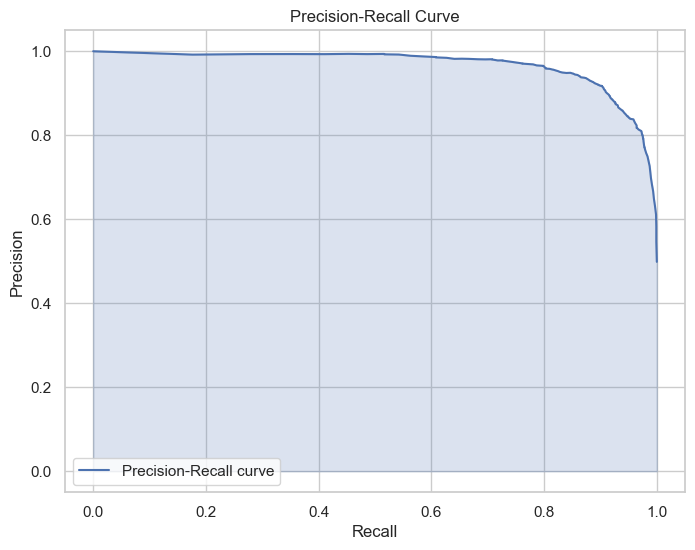

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


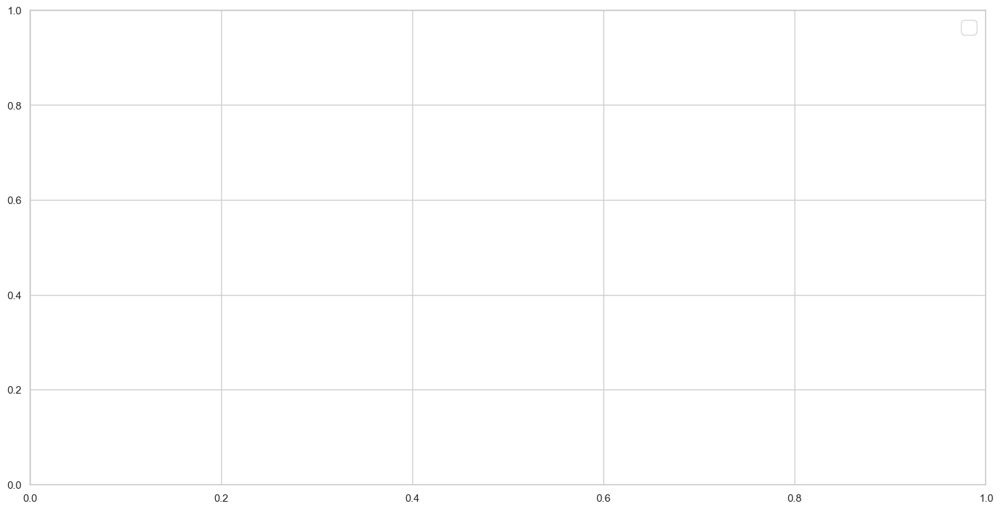

In [ ]:
unsampled_data_prediction_RF = rf_pipe.predict_proba(original_df_with_pcs[X_features])
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_recall_curve

# True labels are the test set labels (test_y)
y_true = test_y

# Predicted probabilities for the positive class (class 1) from the random forest model
y_pred = rf_pipe.predict_proba(test_x)[:, 1]  # Get probabilities for class 1 (positive class)


# Get precision and recall values
precision, recall, _ = precision_recall_curve(y_true, y_pred)

# Create the plot using seaborn
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='b', label='Precision-Recall curve')
plt.fill_between(recall, precision, color='b', alpha=0.2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()